<a href="https://colab.research.google.com/github/valentingracia/codingDojoDC/blob/main/Prueba1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Alumno : Valentin Gracia
1er examen Data Science G1 2021 (iteracion 1, sabado 28/8/2021)
_________________________________________________

El analisis exploratorio se efectuara con una bateria de reportes provenientes de la libreria "pandas_profiling_report", la cual debe ser instalada por una unica vez, junto con reiniciar el kernel de collab. Luego de eso favor comentar la siguiente linea

In [44]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


#importamos las librerias clasicas

In [45]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sb

from pandas_profiling import ProfileReport



#creamos el dataset

In [46]:
employees_df=pd.read_csv("/content/drive/MyDrive/Coding Dojo/Semana3/employee_attrition.csv")
employees_df.head(2)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,NaN,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7


In [47]:
#ProfileReport(employees_df,title="hola",html={'style':{'full_width':True}})

profile = ProfileReport(employees_df,title="Attrition Employee Survey Exploration",html={'style':{'full_width':True}})
profile

Summarize dataset:   0%|          | 0/48 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#Insights:
#1) la variable Gender esta incompleta, lo que invalida análisis por genero.
#2) la variable EmployeeNumber cumple con ser única y podemos utilizarla como índice o ID



#vamos a hacer una matriz de correlación con seaborn, para detectar nivel de correlacion entre variables

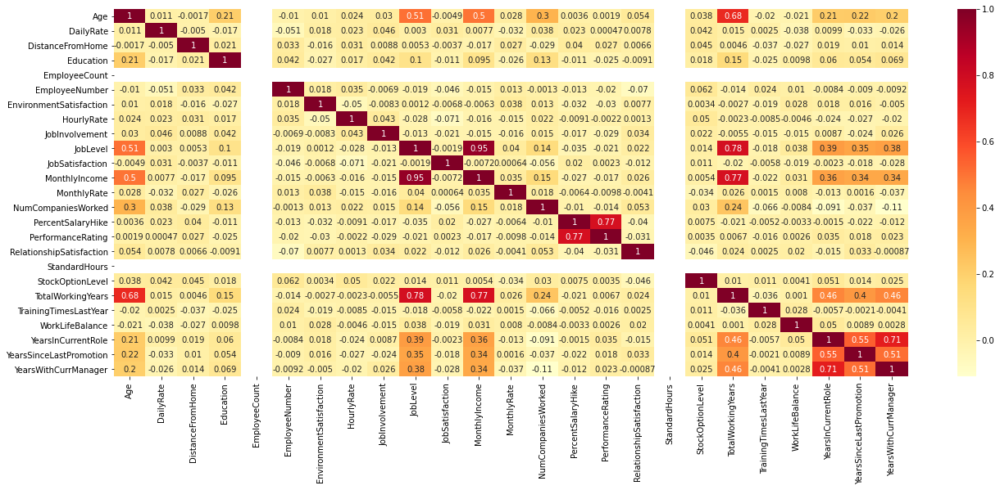

In [48]:
a4_dims = (21.7, 8.27)
fig, ax = plt.subplots(figsize=a4_dims)
sb.heatmap(employees_df.corr(), cmap="YlOrRd", annot=True);



#De esta matriz, podemos observar hechos como : 
#Extraño que "Job Satisfaction level" (que podría ser un proxy de Attrition) ni  "WorklifeBalance", estén mas correlacionadas con otras variables


# Ahora montaremos algunas Vistas interesantes.

Quisiera señalar que me incline por las tablas, mas que por los gráficos, debido a la naturaleza del dataset y del vector objectivo "Attrition" (categorico - binario). Pues la tabla al poder resumir mas informacion en menos espacio, me parece mas útil para esta ocasión (contrario seria un dataset de prediccion de sueldos en el tiempo)

In [49]:
table = pd.pivot_table(employees_df, values='EmployeeNumber', index=['Department'],
                    columns=['Attrition'], aggfunc='count',margins=True,margins_name="Total")

table2=table.style.background_gradient(cmap='YlOrRd').set_properties(**{'font-size': '20px'})
               
                    

table2


Attrition,No,Yes,Total
Department,,,
Human Resources,51,12,63
Research & Development,828,133,961
Sales,354,92,446
Total,1233,237,1470


In [50]:
table = pd.pivot_table(employees_df, values='EmployeeNumber', index=['Department'],
                    columns=['Attrition'], aggfunc=len,margins=True,margins_name="Total")

#.style.format('{0:.0%}')
table2 = table.div( table.iloc[:,-1], axis=0 )
table2.style.format('{0:.0%}')
      

Attrition,No,Yes,Total
Department,,,
Human Resources,81%,19%,100%
Research & Development,86%,14%,100%
Sales,79%,21%,100%
Total,84%,16%,100%


#Pie para ver proporción

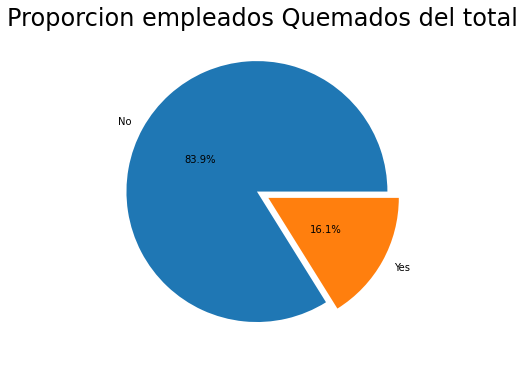

In [51]:
#Using matplotlib
pie_range=employees_df.groupby(["Attrition"])["EmployeeNumber"].count()


pie, ax = plt.subplots(figsize=[10,6])
labels = pie_range.keys()
plt.pie(x=pie_range, autopct="%.1f%%", explode=[0.05]*2, labels=labels, pctdistance=0.5);
plt.title("Proporcion empleados Quemados del total", fontsize=24);


#de las tablas anteriores se desprende el hecho que el 16%, approximadamente 240 empleados, ya se siente desgastado, lo que los hace candidatos a caer en sindrome de burnout, los cuales tienen impacto directo en productividad individual como en los indicadores de clima del area del que son parte. Sera en ese 16% donde seguiremos buscando


#Establecemos dataset de los solo quemados

In [52]:
employees_AttritionYes_df=employees_df[employees_df["Attrition"]=="Yes"]
table = pd.pivot_table(employees_AttritionYes_df, values='EmployeeNumber', index=['JobRole'],
                    columns=['Department'], aggfunc='count',margins=True,margins_name="Total",fill_value=0)

table2=table.style.background_gradient(cmap='YlOrRd').set_properties(**{'font-size': '20px'})
table2

Department,Human Resources,Research & Development,Sales,Total
JobRole,,,,
Healthcare Representative,0,9,0,9
Human Resources,12,0,0,12
Laboratory Technician,0,62,0,62
Manager,0,3,2,5
Manufacturing Director,0,10,0,10
Research Director,0,2,0,2
Research Scientist,0,47,0,47
Sales Executive,0,0,57,57
Sales Representative,0,0,33,33


#ahora comparamos los Quemados vs los No Quemados por Posicion y Departamento

In [53]:

table = pd.pivot_table(employees_df, values='EmployeeNumber', index=['JobRole'],
                    columns=['Attrition','Department'], aggfunc='count',margins=True,margins_name="Total",fill_value=0)
table

Attrition                              No                         ...   Yes Total
Department                Human Resources Research & Development  ... Sales      
JobRole                                                           ...            
Healthcare Representative               0                    122  ...     0   131
Human Resources                        40                      0  ...     0    52
Laboratory Technician                   0                    197  ...     0   259
Manager                                11                     51  ...     2   102
Manufacturing Director                  0                    135  ...     0   145
Research Director                       0                     78  ...     0    80
Research Scientist                      0                    245  ...     0   292
Sales Executive                         0                      0  ...    57   326
Sales Representative                    0                      0  ...    33    83
Total                                  51                    828  ...    92  1470

[10 rows x 7 columns]

In [54]:
table2 = table.div( table.iloc[:,-1], axis=0 )
table2.style.format('{0:.0%}')


#table2=table.style.background_gradient(cmap='YlOrRd').set_properties(**{'font-size': '20px'})
#table2



#De aqui podemos ver que las posiciones donde mas quemados hay son "Laboratory Technician en R&D con un 24% y "Sales Representative" con un  40%

seguiremos indagando con los ejecutivos de venta, pues ellos son claves en los indicadores globales financieros de la compañia, pero como ya sospechamos es aqui tambien donde los indicadores de rrhh y sostenibilidad deben sufrir mas.

#Con esta vista buscamos alguna relacion por viajes de negocios y distancia al trabajo, que son dos factores que involucran horas perdidas, que podrian ser invertidas en tiempo de calidad de vida.  




In [55]:
employees_SalesmanRepYes_df=employees_AttritionYes_df[employees_AttritionYes_df["JobRole"]=="Sales Representative"]


table = pd.pivot_table(employees_SalesmanRepYes_df, values='EmployeeNumber', index=['DistanceFromHome'],
                    columns=['BusinessTravel','Attrition'], aggfunc='count',margins=True,margins_name="Total",fill_value=0)

table2=table.style.background_gradient(cmap='YlOrRd').set_properties(**{'font-size': '20px'})
table2



BusinessTravel,Travel_Frequently,Travel_Rarely,Total
Attrition,Yes,Yes,
DistanceFromHome,,,
1,5,2,7
2,1,2,3
3,1,1,2
5,1,2,3
6,1,0,1
7,1,2,3
9,2,4,6
12,1,1,2


#seguiremos aperturando el grupo mas grande, ahora por variables relacionadas a antiguedad en la compañia

*  



In [56]:
table = pd.pivot_table(employees_SalesmanRepYes_df, values='EmployeeNumber', index=['YearsAtCompany'],
                    columns=['YearsInCurrentRole'], aggfunc='count',margins=True,margins_name="Total",fill_value=0)


table2=table.style.background_gradient(cmap='YlOrRd').set_properties(**{'font-size': '20px'})
table2

YearsInCurrentRole,0,2,3,7,Total
YearsAtCompany,,,,,
0,4,0,0,0,4
1,13,0,0,0,13
2,0,4,0,0,4
3,0,7,0,0,7
4,0,0,2,0,2
5,0,0,2,0,2
9,0,0,0,1,1
Total,17,11,4,1,33


#Ahora por percepcion de balance trabajo vida

In [57]:
table = pd.pivot_table(employees_SalesmanRepYes_df, values='EmployeeNumber', index=['WorkLifeBalance'],
                    columns=['Attrition'], aggfunc='count',margins=True,margins_name="Total",fill_value=0)


table2=table.style.background_gradient(cmap='YlOrRd').set_properties(**{'font-size': '20px'})
table2

Attrition,Yes,Total
WorkLifeBalance,,
2,6,6
3,19,19
4,8,8
Total,33,33



#De las vistas anteriores descartamos la directa relación de factores como tiempos muertos relacionados al trabajo, como también los de calidad de vida por balance trabajo/vida, como factor gatillante de la percepción de quemado.


#las conclusiones van por le lado de que los 1eros dos años de los sales representatives, son muy duros debido a las metas y estabilizacion de cartera de clientes mayoristas. 

#Se planteara la creacion de algún programa de wellness por parte de RRHH y coaching por parte de los vendedores super seniors(su bono anual estara en parte indexadoa este programa)


#Con la construcción de modelos predictivos y descriptivos, se podrán encontrar nuevas implicancias del set de datos, que pueden entregar valor adicional.
